In [5]:
import os
from google.colab import drive
drive.mount("/content/drive")

BASE_DIR   = "/content/drive/MyDrive/Capstone Project/Model Nutrivision/Train 2"
OUTPUT_DIR = f"{BASE_DIR}/Modeling/output"
IMAGES_DIR = f"{BASE_DIR}/Dataset/train"
os.makedirs(OUTPUT_DIR, exist_ok=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Preprocessing

### Data Load

In [ ]:
import json
import os
from collections import Counter, defaultdict
import tensorflow as tf

ANNOT_PATH = f"{BASE_DIR}/Dataset/_annotation.coco.json"

with open(ANNOT_PATH) as f:
    coco = json.load(f)

id2img = {img["id"]: img for img in coco["images"]}

print(f"Total images     : {len(coco['images'])}")
print(f"Total annotations: {len(coco['annotations'])}")

Total images     : 598
Total annotations: 4831


### Mapping brand

In [ ]:
VALID_BRANDS = {"mcd", "kfc", "bk"}

ALIAS_MAP = {
    "ayamcrispy"          : "friedchicken",
    "ayamkrispymcdonalds" : "friedchicken",
    "ayamspicymcdonalds"  : "friedchicken",
    "spicyfriedchicken"   : "friedchicken",
    "ayamsweetchili"      : "friedchicken",
    "friesmedium"         : "frenchfries",
    "mcnuggets"           : "nuggets",
    "cocacola"            : "cola",
    "coke"                : "cola",
    "hotcoffe"            : "hotcoffee",
    "icedcoffe"           : "icedcoffee",
    "twis"                : "twix",
    "sundaechocolate"     : "sundae",
    "mcflurryfeatoreo"    : "mcflurry",
    "mcflurrymatchachoco" : "mcflurry"
}

def normalize_item(item):
    return ALIAS_MAP.get(item, item)

def split_label(name):
    parts = name.split("-", 1)
    if len(parts) == 2 and parts[0] in VALID_BRANDS:
        return parts[0], normalize_item(parts[1])
    return None, None

### Cek distribusi

In [ ]:
THRESHOLD = 28

item_counts = Counter()
for ann in coco["annotations"]:
    cat_id   = ann["category_id"]
    cat_name = next((
        c["name"] if isinstance(c, dict) else c
        for c in coco["categories"]
        if (c["id"] if isinstance(c, dict) else None) == cat_id
    ), None)
    if not cat_name:
        continue
    _, item = split_label(cat_name)
    if item:
        item_counts[item] += 1

print("Distribusi item:")
for name, count in sorted(item_counts.items(), key=lambda x: x[1]):
    flag = "DROP" if count < THRESHOLD else "✅"
    print(f"  {count:>4}  {name}  {flag}")

VALID_ITEMS = {item for item, count in item_counts.items() if count >= THRESHOLD}
print(f"\nKelas valid  : {len(VALID_ITEMS)}")
print(f"Kelas di-drop: {sorted(item_counts.keys() - VALID_ITEMS)}")

Distribusi item:
     1  strawberrysundae  DROP
     1  superfloatcoke  DROP
     1  spicychickenbites  DROP
     1  quarterpounderwithcheese  DROP
     2  latte  DROP
     2  orientalDon  DROP
     2  tehsosro  DROP
     2  kingdepollo  DROP
     2  superfloatmango  DROP
     2  twix  DROP
     4  sprite  DROP
     5  chickenpotpie  DROP
     6  perkedel  DROP
     6  coleslaw  DROP
     7  twisty  DROP
     7  icedcoffee  DROP
     7  taco  DROP
    10  mangofloat  DROP
    11  hotcoffee  DROP
    11  superfloatvanila  DROP
    14  bbqbeefburger  DROP
    15  yakinikuDon  DROP
    15  choconutsundae  DROP
    16  doublecheeseburger  DROP
    19  spaghettiDeluxe  DROP
    28  fanta  ✅
    28  soup  ✅
    28  mochafloat  ✅
    31  wingsspringkle  ✅
    34  crispyburger  ✅
    36  sausagemcmuffin  ✅
    39  veggieburger  ✅
    40  pepsi  ✅
    45  zingerburger  ✅
    53  whopper  ✅
    55  creamsoup  ✅
    62  beefburger  ✅
    65  bigmac  ✅
    65  chickenstrips  ✅
    68  chickenball 

### Mapping

brand_map digunakan untuk melatih model 1 nantinya (detect brand), item_map untuk model 2 (detect makanan)

In [ ]:
BRAND_NAMES = sorted(VALID_BRANDS)
ITEM_NAMES  = sorted(VALID_ITEMS)

BRAND_MAP = {b: i for i, b in enumerate(BRAND_NAMES)}
ITEM_MAP  = {it: i for i, it in enumerate(ITEM_NAMES)}

print(f"Brands ({len(BRAND_MAP)}): {BRAND_MAP}")
print(f"Items  ({len(ITEM_MAP)} kelas): {ITEM_NAMES}")

with open(f"{OUTPUT_DIR}/brand_map.json", "w") as f:
    json.dump(BRAND_MAP, f, indent=2)
with open(f"{OUTPUT_DIR}/item_map.json", "w") as f:
    json.dump(ITEM_MAP, f, indent=2)

print("brand_map.json & item_map.json saved")

Brands (3): {'bk': 0, 'kfc': 1, 'mcd': 2}
Items  (29 kelas): ['beefburger', 'bigmac', 'cheeseburger', 'cheesytots', 'chickenball', 'chickenbucket', 'chickenburger', 'chickenstrips', 'cola', 'creamsoup', 'crispyburger', 'fanta', 'frenchfries', 'friedchicken', 'hashbrown', 'mcflurry', 'mochafloat', 'nuggets', 'onionring', 'pepsi', 'popcornchicken', 'rice', 'sausagemcmuffin', 'soup', 'sundae', 'veggieburger', 'whopper', 'wingsspringkle', 'zingerburger']
brand_map.json & item_map.json saved


Mengembalikan value aslinya (sebelumnya kfc-friedchicken, dipisahkan "-" untuk ambil brand_map dan item_map)

In [ ]:
catid2label = {}

for cat in coco["categories"]:
    if not isinstance(cat, dict):
        continue
    cat_id   = cat["id"]
    cat_name = cat["name"]
    brand, item = split_label(cat_name)
    if brand and item and item in ITEM_MAP:
        catid2label[cat_id] = (BRAND_MAP[brand], ITEM_MAP[item])

print(f"Mapped {len(catid2label)} categories")

Mapped 51 categories


In [ ]:
annots_per_image = defaultdict(list)

for ann in coco["annotations"]:
    cat_id = ann["category_id"]
    if cat_id not in catid2label:
        continue

    brand_idx, item_idx = catid2label[cat_id]
    x, y, w, h = ann["bbox"]
    annots_per_image[ann["image_id"]].append({
        "brand_idx": brand_idx,
        "item_idx" : item_idx,
        "bbox"     : [x, y, w, h]
    })

print(f"Images dengan anotasi valid: {len(annots_per_image)}")

Images dengan anotasi valid: 581


### Export tf_record

Model 1

In [ ]:
def _bytes(v): return tf.train.Feature(bytes_list=tf.train.BytesList(value=[v]))
def _int(v):   return tf.train.Feature(int64_list=tf.train.Int64List(value=[v]))
def _ints(v):  return tf.train.Feature(int64_list=tf.train.Int64List(value=v))
def _float(v): return tf.train.Feature(float_list=tf.train.FloatList(value=v))

import random
from collections import defaultdict

BRAND_TFR = f"{OUTPUT_DIR}/brand_train.tfrecord"
written = skipped = 0

brand_to_ids = defaultdict(list)
for img_id, anns in annots_per_image.items():
    brand_idx = anns[0]["brand_idx"]
    brand_to_ids[brand_idx].append(img_id)

random.seed(42)
train_ids, val_ids = [], []

for brand_idx, ids in brand_to_ids.items():
    random.shuffle(ids)
    split = int(len(ids) * 0.9)
    train_ids.extend(ids[:split])
    val_ids.extend(ids[split:])

random.shuffle(train_ids)
random.shuffle(val_ids)

print("Distribusi train:")
train_counts = Counter(annots_per_image[i][0]["brand_idx"] for i in train_ids)
for idx, count in sorted(train_counts.items()):
    print(f"  {BRAND_NAMES[idx]}: {count}")

print("Distribusi val:")
val_counts = Counter(annots_per_image[i][0]["brand_idx"] for i in val_ids)
for idx, count in sorted(val_counts.items()):
    print(f"  {BRAND_NAMES[idx]}: {count}")

for split_name, split_ids in [("brand_train", train_ids), ("brand_val", val_ids)]:
    out_path = f"{OUTPUT_DIR}/{split_name}.tfrecord"
    written = skipped = 0

    with tf.io.TFRecordWriter(out_path) as writer:
        for img_id in split_ids:
            anns     = annots_per_image[img_id]
            img_meta = id2img[img_id]
            img_path = os.path.join(IMAGES_DIR, img_meta["file_name"])

            if not os.path.exists(img_path):
                skipped += 1
                continue

            with open(img_path, "rb") as f:
                img_bytes = f.read()

            feature = {
                "image"    : _bytes(img_bytes),
                "brand_idx": _int(anns[0]["brand_idx"]),
                "filename" : _bytes(img_meta["file_name"].encode()),
            }
            writer.write(tf.train.Example(
                features=tf.train.Features(feature=feature)
            ).SerializeToString())
            written += 1

    print(f"{split_name}.tfrecord > written: {written}, skipped: {skipped}")

Distribusi train:
  bk: 147
  kfc: 116
  mcd: 259
Distribusi val:
  bk: 17
  kfc: 13
  mcd: 29
brand_train.tfrecord > written: 522, skipped: 0
brand_val.tfrecord > written: 59, skipped: 0


Model 2

In [ ]:
for split_name, split_ids in [("menu_train", train_ids), ("menu_val", val_ids)]:
    out_path = f"{OUTPUT_DIR}/{split_name}.tfrecord"
    written = skipped = 0

    with tf.io.TFRecordWriter(out_path) as writer:
        for img_id in split_ids:
            anns     = annots_per_image[img_id]
            img_meta = id2img[img_id]
            height   = img_meta["height"]
            width    = img_meta["width"]
            img_path = os.path.join(IMAGES_DIR, img_meta["file_name"])

            if not os.path.exists(img_path):
                skipped += 1
                continue

            with open(img_path, "rb") as f:
                img_bytes = f.read()

            xmins, ymins, xmaxs, ymaxs, item_idxs = [], [], [], [], []
            for ann in anns:
                x, y, w, h = [float(v) for v in ann["bbox"]]
                xmins.append(max(0.0, x / width))
                ymins.append(max(0.0, y / height))
                xmaxs.append(min(1.0, (x + w) / width))
                ymaxs.append(min(1.0, (y + h) / height))
                item_idxs.append(ann["item_idx"])

            feature = {
                "image"     : _bytes(img_bytes),
                "filename"  : _bytes(img_meta["file_name"].encode()),
                "height"    : _int(height),
                "width"     : _int(width),
                "xmins"     : _float(xmins),
                "ymins"     : _float(ymins),
                "xmaxs"     : _float(xmaxs),
                "ymaxs"     : _float(ymaxs),
                "item_idxs" : _ints(item_idxs),
            }
            writer.write(tf.train.Example(
                features=tf.train.Features(feature=feature)
            ).SerializeToString())
            written += 1

    print(f"{split_name}.tfrecord > written: {written}, skipped: {skipped}")

menu_train.tfrecord > written: 522, skipped: 0
menu_val.tfrecord > written: 59, skipped: 0


Val

In [ ]:
print("Brand TFRecord")
for rec in tf.data.TFRecordDataset(f"{OUTPUT_DIR}/brand_train.tfrecord").take(3):
    ex = tf.train.Example()
    ex.ParseFromString(rec.numpy())
    brand_idx = ex.features.feature["brand_idx"].int64_list.value[0]
    fname     = ex.features.feature["filename"].bytes_list.value[0].decode()
    print(f"  {fname} → {BRAND_NAMES[brand_idx]}")

print()
print("Menu TFRecord")
for rec in tf.data.TFRecordDataset(f"{OUTPUT_DIR}/menu_train.tfrecord").take(3):
    ex = tf.train.Example()
    ex.ParseFromString(rec.numpy())
    fname     = ex.features.feature["filename"].bytes_list.value[0].decode()
    items     = [ITEM_NAMES[i] for i in ex.features.feature["item_idxs"].int64_list.value]
    print(f"  {fname} → {items}")

Brand TFRecord
  30_jpg.rf.gJORV0i2PZAtFr56Hu8Q.jpg → kfc
  mcd6_jpeg.rf.hFCRwceMOvxdHH7ROwot.jpeg → mcd
  mcd54_jpeg.rf.fD6CcrDxqnNbkZO8UvXR.jpeg → mcd

Menu TFRecord
  30_jpg.rf.gJORV0i2PZAtFr56Hu8Q.jpg → ['creamsoup']
  mcd6_jpeg.rf.hFCRwceMOvxdHH7ROwot.jpeg → ['rice', 'friedchicken', 'friedchicken', 'cola', 'mcflurry', 'mcflurry', 'friedchicken']
  mcd54_jpeg.rf.fD6CcrDxqnNbkZO8UvXR.jpeg → ['cola', 'friedchicken', 'friedchicken', 'friedchicken', 'friedchicken', 'frenchfries', 'rice', 'rice']


In [ ]:
import pandas as pd

rows = []
for img_id, anns in annots_per_image.items():
    for ann in anns:
        brand = BRAND_NAMES[ann["brand_idx"]]
        item  = ITEM_NAMES[ann["item_idx"]]
        rows.append({"brand": brand, "item": item, "key": f"{brand}-{item}"})

df = pd.DataFrame(rows).drop_duplicates(subset="key").sort_values(["brand", "item"]).reset_index(drop=True)

print(df.groupby("brand")["item"].apply(list).to_string())
print(f"\nTotal unique keys: {len(df)}")

brand
bk     [beefburger, cheeseburger, cheesytots, chicken...
kfc    [chickenball, chickenbucket, chickenstrips, co...
mcd    [beefburger, bigmac, cheeseburger, chickenburg...

Total unique keys: 46


## Modeling

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

import os
BASE_DIR   = "/content/drive/MyDrive/Train 2"
OUTPUT_DIR = f"{BASE_DIR}/Modeling/output"
IMAGES_DIR = f"{BASE_DIR}/Dataset/train"

Mounted at /content/drive


### Model 1 - Klasifikasi Brand

In [ ]:
import tensorflow as tf
import json
import numpy as np
import os

BRAND_TRAIN_TFR = f"{OUTPUT_DIR}/brand_train.tfrecord"
BRAND_VAL_TFR   = f"{OUTPUT_DIR}/brand_val.tfrecord"

with open(f"{OUTPUT_DIR}/brand_map.json") as f:
    BRAND_MAP = json.load(f)

BRAND_NAMES  = sorted(BRAND_MAP.keys())
NUM_BRANDS   = len(BRAND_NAMES)
IMG_SIZE     = 224
BATCH_SIZE   = 32
EPOCHS_P1    = 20
EPOCHS_P2    = 20
LR_P1        = 1e-3
LR_P2        = 1e-5

#### Load & Preprocessing Dataset

In [ ]:
import math

def count_records(tfr_path):
    return sum(1 for _ in tf.data.TFRecordDataset(tfr_path))

TRAIN_SIZE  = count_records(BRAND_TRAIN_TFR)
VAL_SIZE    = count_records(BRAND_VAL_TFR)
TRAIN_STEPS = math.ceil(TRAIN_SIZE / BATCH_SIZE)
VAL_STEPS   = math.ceil(VAL_SIZE   / BATCH_SIZE)

print(f"Train: {TRAIN_SIZE} samples → {TRAIN_STEPS} steps")
print(f"Val  : {VAL_SIZE} samples → {VAL_STEPS} steps")

def parse_brand(record):
    feature = {
        "image"    : tf.io.FixedLenFeature([], tf.string),
        "brand_idx": tf.io.FixedLenFeature([], tf.int64),
    }
    ex    = tf.io.parse_single_example(record, feature)
    img   = tf.image.decode_image(ex["image"], channels=3, expand_animations=False)
    img   = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img   = tf.cast(img, tf.float32) / 255.0
    label = tf.one_hot(ex["brand_idx"], NUM_BRANDS)
    return img, label

def augment(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_brightness(img, 0.3)
    img = tf.image.random_contrast(img, 0.7, 1.3)
    img = tf.image.random_saturation(img, 0.7, 1.3)
    img = tf.image.random_hue(img, 0.1)
    img = tf.image.resize_with_crop_or_pad(img, IMG_SIZE + 30, IMG_SIZE + 30)
    img = tf.image.random_crop(img, size=[IMG_SIZE, IMG_SIZE, 3])
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img, label

def build_dataset(tfr_path, training=False, batch_size=BATCH_SIZE):
    ds = tf.data.TFRecordDataset(tfr_path)
    ds = ds.map(parse_brand, num_parallel_calls=tf.data.AUTOTUNE)
    if training:
        ds = ds.shuffle(500).map(augment, num_parallel_calls=tf.data.AUTOTUNE)
        ds = ds.batch(batch_size)
        ds = ds.repeat()
    else:
        ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = build_dataset(BRAND_TRAIN_TFR, training=True)
val_ds   = build_dataset(BRAND_VAL_TFR,   training=False)

print(f"Brands: {BRAND_NAMES}")

Train: 522 samples → 17 steps
Val  : 59 samples → 2 steps
Brands: ['bk', 'kfc', 'mcd']


#### Build Model

In [ ]:
from tqdm.notebook import tqdm

class TqdmCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.pbar = tqdm(total=TRAIN_STEPS, desc=f"Epoch {epoch+1}", unit="batch")
    def on_train_batch_end(self, batch, logs=None):
        self.pbar.update(1)
        self.pbar.set_postfix({
            "loss": f"{logs.get('loss', 0):.4f}",
            "acc" : f"{logs.get('accuracy', 0):.4f}"
        })
    def on_epoch_end(self, epoch, logs=None):
        self.pbar.set_postfix({
            "loss"    : f"{logs.get('loss', 0):.4f}",
            "acc"     : f"{logs.get('accuracy', 0):.4f}",
            "val_loss": f"{logs.get('val_loss', 0):.4f}",
            "val_acc" : f"{logs.get('val_accuracy', 0):.4f}"
        })
        self.pbar.close()

callbacks = [
    TqdmCallback(),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy", patience=7,
        restore_best_weights=True, verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5,
        patience=3, verbose=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        f"{OUTPUT_DIR}/brand_best.keras",
        monitor="val_accuracy",
        save_best_only=True, verbose=1
    )
]

In [ ]:
def build_brand_model(num_classes, img_size=224):
    backbone = tf.keras.applications.MobileNetV2(
        include_top=False, weights="imagenet",
        input_shape=(img_size, img_size, 3)
    )
    backbone.trainable = False

    inputs = tf.keras.Input(shape=(img_size, img_size, 3))
    x = backbone(inputs, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(64, activation="relu")(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation="softmax")(x)

    return model, backbone

model, backbone = build_brand_model(NUM_BRANDS)
model.summary()

Model: "brand_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │        81,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,504,523 (9.55 MB)

 Trainable params: 82,179 (321.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 164,360 (642.04 KB)

#### Train Model

In [ ]:
from collections import Counter

brand_counts = Counter()
for rec in tf.data.TFRecordDataset(BRAND_TRAIN_TFR):
    ex = tf.train.Example()
    ex.ParseFromString(rec.numpy())
    idx = ex.features.feature["brand_idx"].int64_list.value[0]
    brand_counts[BRAND_NAMES[idx]] += 1

print("Distribusi brand:", dict(brand_counts))

total = sum(brand_counts.values())
class_weight = {
    BRAND_MAP[brand]: total / (len(BRAND_NAMES) * count)
    for brand, count in brand_counts.items()
}
print("Class weights:", class_weight)

Distribusi brand: {'bk': 147, 'mcd': 259, 'kfc': 116}
Class weights: {0: 1.183673469387755, 2: 0.6718146718146718, 1: 1.5}


Phase 1 Training

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
history_p1 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=EPOCHS_P1, steps_per_epoch=TRAIN_STEPS,
    validation_steps=VAL_STEPS,
    class_weight=class_weight,
    callbacks=callbacks, verbose=0
)

Epoch 1:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 1: val_accuracy did not improve from 0.83051


Epoch 2:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 2: val_accuracy improved from 0.83051 to 0.84746, saving model to /content/drive/MyDrive/Capstone Project/Model Nutrivision/Train 2/Modeling/output/brand_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/Capstone Project/Model Nutrivision/Train 2/Modeling/output/brand_best.keras


Epoch 3:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 3: val_accuracy did not improve from 0.84746


Epoch 4:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 4: val_accuracy did not improve from 0.84746


Epoch 5:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 5: val_accuracy did not improve from 0.84746


Epoch 6:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 6: val_accuracy did not improve from 0.84746


Epoch 7:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 7: val_accuracy improved from 0.84746 to 0.88136, saving model to /content/drive/MyDrive/Capstone Project/Model Nutrivision/Train 2/Modeling/output/brand_best.keras

Epoch 7: finished saving model to /content/drive/MyDrive/Capstone Project/Model Nutrivision/Train 2/Modeling/output/brand_best.keras


Epoch 8:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 8: val_accuracy did not improve from 0.88136


Epoch 9:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 9: val_accuracy did not improve from 0.88136


Epoch 10:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 10: val_accuracy did not improve from 0.88136


Epoch 11:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 11: val_accuracy did not improve from 0.88136


Epoch 12:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 12: val_accuracy did not improve from 0.88136


Epoch 13:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 13: val_accuracy did not improve from 0.88136


Epoch 14:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 14: val_accuracy did not improve from 0.88136
Epoch 14: early stopping
Restoring model weights from the end of the best epoch: 7.


Phase 2 Training

In [ ]:
for layer in backbone.layers[:-40]:
    layer.trainable = False
for layer in backbone.layers[-40:]:
    layer.trainable = True

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
history_p2 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=EPOCHS_P2, steps_per_epoch=TRAIN_STEPS,
    validation_steps=VAL_STEPS,
    class_weight=class_weight,
    callbacks=callbacks, verbose=0
)

Epoch 1:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 1: val_accuracy did not improve from 0.88136


Epoch 2:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 2: val_accuracy did not improve from 0.88136


Epoch 3:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 3: val_accuracy did not improve from 0.88136


Epoch 4:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 4: val_accuracy did not improve from 0.88136


Epoch 5:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 5: val_accuracy did not improve from 0.88136


Epoch 6:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 6: val_accuracy did not improve from 0.88136


Epoch 7:   0%|          | 0/17 [00:00<?, ?batch/s]


Epoch 7: val_accuracy did not improve from 0.88136
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 1.


#### Eval

In [ ]:
loss, acc = model.evaluate(val_ds, steps=VAL_STEPS)
print(f"Val accuracy: {acc:.4f}")

import numpy as np

y_true, y_pred = [], []
for imgs, labels in val_ds:
    preds = model.predict(imgs, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred, target_names=BRAND_NAMES))

model.export(f"{OUTPUT_DIR}/brand_saved_model")
print("brand_saved_model exported")

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 390ms/step - accuracy: 0.8814 - loss: 0.4667
Val accuracy: 0.8814
              precision    recall  f1-score   support

          bk       0.88      0.88      0.88        17
         kfc       0.92      0.85      0.88        13
         mcd       0.87      0.90      0.88        29

    accuracy                           0.88        59
   macro avg       0.89      0.88      0.88        59
weighted avg       0.88      0.88      0.88        59

Saved artifact at '/content/drive/MyDrive/Capstone Project/Model Nutrivision/Train 2/Modeling/output/brand_saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_1701')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  138517839090256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138520087866320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13852008786

#### Inference


In [ ]:
import os
import numpy as np
import tensorflow as tf
import json

brand_model = tf.saved_model.load(f"{OUTPUT_DIR}/brand_saved_model")
infer = brand_model.signatures["serving_default"]

def predict_brand(img_path):
    raw = tf.io.read_file(img_path)
    img = tf.image.decode_image(raw, channels=3, expand_animations=False)
    img = tf.image.resize(img, [224, 224])
    img = tf.cast(img, tf.float32) / 255.0
    img = tf.expand_dims(img, 0)

    output = infer(img)
    preds  = list(output.values())[0]
    idx    = int(tf.argmax(preds[0]))
    score  = float(preds[0][idx])
    return BRAND_NAMES[idx], score

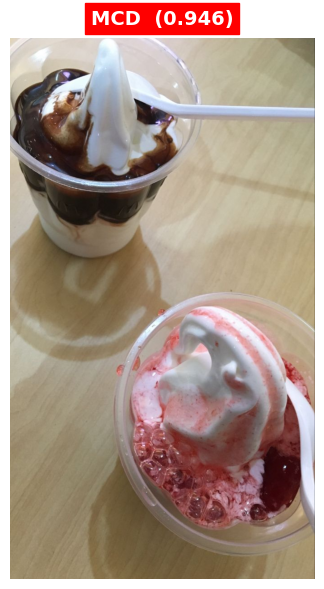

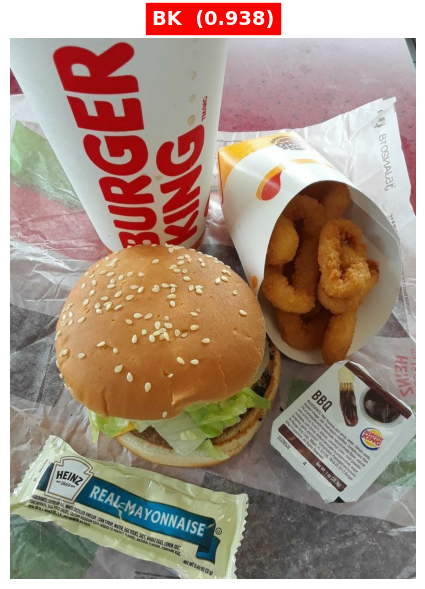

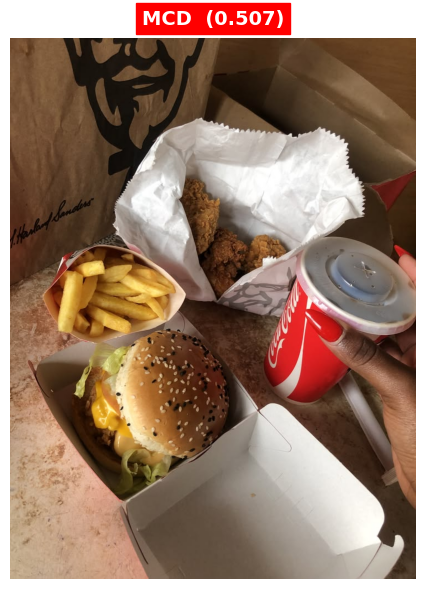

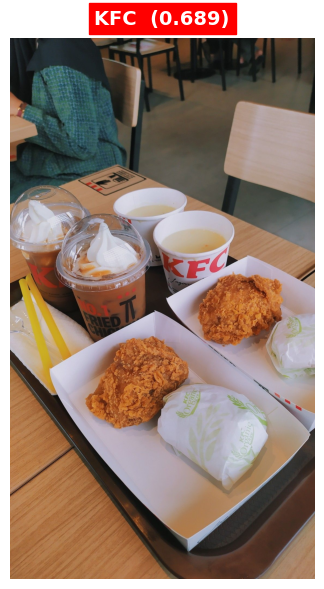

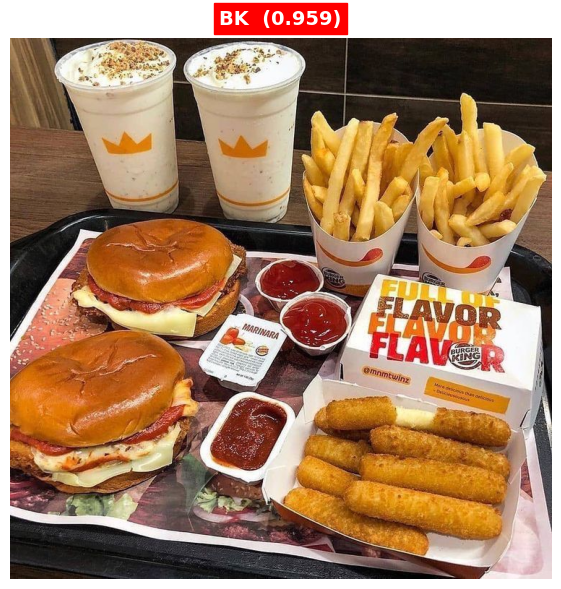

...

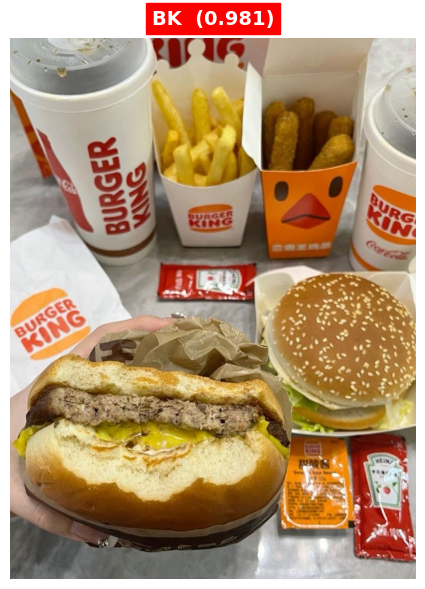

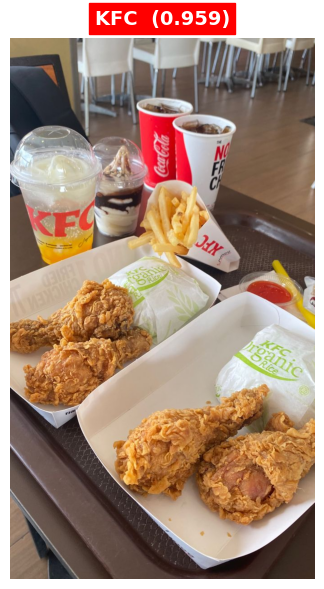

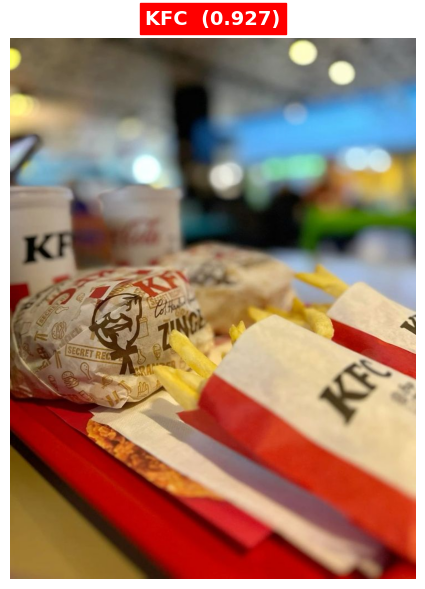

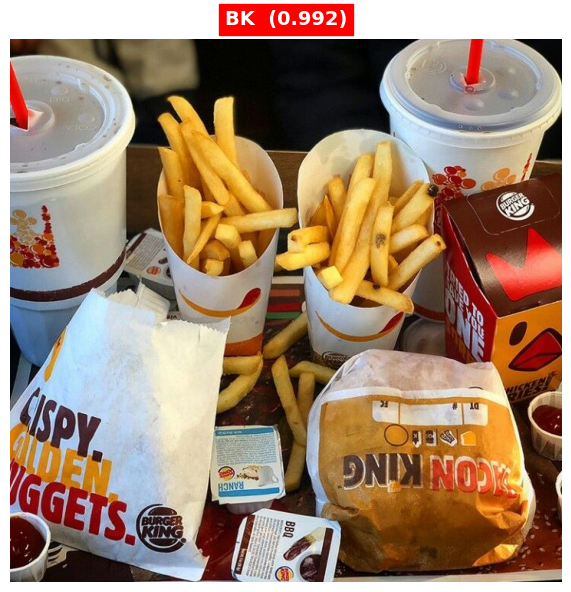

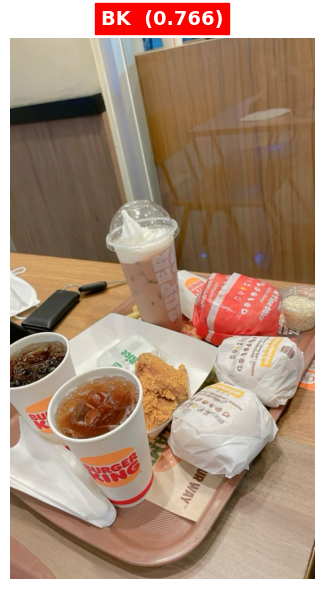

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

TEST_DIR = "/content/"
images   = [f for f in os.listdir(TEST_DIR) if f.endswith((".jpg", ".jpeg", ".png"))]

for fname in sorted(images):
    path          = os.path.join(TEST_DIR, fname)
    brand, score  = predict_brand(path)

    img = mpimg.imread(path)
    fig, ax = plt.subplots(1, figsize=(6, 6))
    ax.imshow(img)
    ax.set_title(f"{brand.upper()}  ({score:.3f})", fontsize=14, fontweight="bold",
                 color="white", backgroundcolor="red", pad=10)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

### Model 2 - Klasifikasi Menu

#### Set up Config

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import tensorflow as tf
import numpy as np
import json, math
from tqdm.notebook import tqdm

with open(f"{OUTPUT_DIR}/item_map.json") as f:
    ITEM_MAP = json.load(f)

ITEM_NAMES  = sorted(ITEM_MAP.keys())
NUM_CLASSES = len(ITEM_NAMES)
IMG_SIZE    = 512
BATCH_SIZE  = 4
LR_P1       = 1e-3
LR_P2       = 1e-5
EPOCHS_P1   = 50
EPOCHS_P2   = 50

STRIDES      = [8, 16, 32]
FEAT_SHAPES  = [(IMG_SIZE // s, IMG_SIZE // s) for s in STRIDES]
TOTAL_POINTS = sum(h * w for h, w in FEAT_SHAPES)

print(f"NUM_CLASSES  : {NUM_CLASSES}")
print(f"FEAT_SHAPES  : {FEAT_SHAPES}")
print(f"TOTAL_POINTS : {TOTAL_POINTS}")

NUM_CLASSES  : 29
FEAT_SHAPES  : [(64, 64), (32, 32), (16, 16)]
TOTAL_POINTS : 5376


#### Defining Loss Function

In [ ]:
class WeightedFeatureFusion(tf.keras.layers.Layer):
    def __init__(self, num_inputs, **kwargs):
        super().__init__(**kwargs)
        self.num_inputs = num_inputs

    def build(self, input_shape):
        self.w = self.add_weight(
            shape=(self.num_inputs,), initializer="ones", trainable=True
        )

    def call(self, inputs):
        w     = tf.nn.relu(self.w)
        total = tf.reduce_sum(w) + 1e-4
        return tf.add_n([inputs[i] * (w[i] / total) for i in range(self.num_inputs)])

    def get_config(self):
        return {**super().get_config(), "num_inputs": self.num_inputs}

class FCOSRegressionLoss(tf.keras.losses.Loss):
    def call(self, y_true, y_pred):
        mask     = y_true[..., 4]
        reg_true = y_true[..., :4]
        pos_mask = tf.cast(mask > 0, tf.float32)
        num_pos  = tf.reduce_sum(pos_mask) + 1e-7

        pred_l, pred_t, pred_r, pred_b = tf.unstack(y_pred,    axis=-1)
        true_l, true_t, true_r, true_b = tf.unstack(reg_true,  axis=-1)

        # L1 loss
        l1 = tf.abs(y_pred - reg_true)
        l1 = tf.reduce_sum(tf.reduce_sum(l1, axis=-1) * pos_mask) / num_pos

        # GIoU loss
        inter_w   = tf.minimum(pred_l, true_l) + tf.minimum(pred_r, true_r)
        inter_h   = tf.minimum(pred_t, true_t) + tf.minimum(pred_b, true_b)
        inter     = tf.maximum(inter_w, 0) * tf.maximum(inter_h, 0)
        pred_area = (pred_l + pred_r) * (pred_t + pred_b)
        true_area = (true_l + true_r) * (true_t + true_b)
        union     = pred_area + true_area - inter + 1e-7
        iou       = inter / union

        # Enclosing box
        enc_w = tf.maximum(pred_l, true_l) + tf.maximum(pred_r, true_r)
        enc_h = tf.maximum(pred_t, true_t) + tf.maximum(pred_b, true_b)
        enc   = enc_w * enc_h + 1e-7

        giou  = iou - (enc - union) / enc
        giou_loss = tf.reduce_sum((1 - giou) * pos_mask) / num_pos

        return l1 + giou_loss

    def get_config(self):
        return super().get_config()

class FCOSCenterness(tf.keras.losses.Loss):
    def call(self, y_true, y_pred):
        ctr_true = tf.squeeze(y_true, axis=-1)   # [B, N]
        y_pred   = tf.squeeze(y_pred, axis=-1)   # [B, N]
        y_pred   = tf.clip_by_value(y_pred, 1e-7, 1-1e-7)
        bce      = -ctr_true*tf.math.log(y_pred) - (1-ctr_true)*tf.math.log(1-y_pred)
        return tf.reduce_mean(bce)

    def get_config(self):
        return super().get_config()

class FocalLoss(tf.keras.losses.Loss):
    def __init__(self, gamma=3.0, alpha=0.85, label_smoothing=0.1, **kwargs):
        super().__init__(**kwargs)
        self.gamma          = gamma
        self.alpha          = alpha
        self.label_smoothing = label_smoothing

    def call(self, y_true, y_pred):
        # Label smoothing
        y_true  = y_true * (1 - self.label_smoothing) + \
                  self.label_smoothing / tf.cast(tf.shape(y_true)[-1], tf.float32)
        y_pred  = tf.clip_by_value(y_pred, 1e-7, 1-1e-7)
        bce     = -y_true*tf.math.log(y_pred) - (1-y_true)*tf.math.log(1-y_pred)
        p_t     = y_true*y_pred + (1-y_true)*(1-y_pred)
        alpha_t = y_true*self.alpha + (1-y_true)*(1-self.alpha)
        return tf.reduce_mean(alpha_t * tf.pow(1-p_t, self.gamma) * bce)

    def get_config(self):
        return {**super().get_config(),
                "gamma": self.gamma, "alpha": self.alpha,
                "label_smoothing": self.label_smoothing}

In [ ]:
CLASS_MAX_OVERRIDE = {}
TARGET = 500

for i, name in enumerate(ITEM_NAMES):
    if name in item_counts and item_counts[name] > TARGET:
        ratio = TARGET / item_counts[name]
        override_val = max(15, int(100 * ratio))
        CLASS_MAX_OVERRIDE[i] = override_val

print("CLASS_MAX_OVERRIDE:")
for idx, val in sorted(CLASS_MAX_OVERRIDE.items()):
    print(f"  {ITEM_NAMES[idx]:<25} → max {val}")

def compute_fcos_targets(gt_boxes, gt_labels, feat_shapes, strides, num_classes,
                         max_pos_per_class=100,
                         per_class_override=None):
    all_cls = []
    all_reg = []
    all_ctr = []

    def get_max(label):
        if per_class_override and label in per_class_override:
            return per_class_override[label]
        return max_pos_per_class

    for (fh, fw), stride in zip(feat_shapes, strides):
        cls_map = np.zeros((fh, fw, num_classes), dtype=np.float32)
        reg_map = np.zeros((fh, fw, 5),           dtype=np.float32)
        ctr_map = np.zeros((fh, fw, 1),           dtype=np.float32)

        class_counts = np.zeros(num_classes, dtype=np.int32)

        for box, label in zip(gt_boxes, gt_labels):
            if label < 0 or label >= num_classes:
                continue

            y1, x1, y2, x2 = box
            fy1 = y1 * fh; fx1 = x1 * fw
            fy2 = y2 * fh; fx2 = x2 * fw

            for i in range(fh):
                for j in range(fw):
                    cy = i + 0.5
                    cx = j + 0.5
                    if fy1 < cy < fy2 and fx1 < cx < fx2:
                        if class_counts[label] >= get_max(label):
                            continue

                        l = cx - fx1; t = cy - fy1
                        r = fx2 - cx; b = fy2 - cy
                        ctr = np.sqrt(
                            (min(l,r)/(max(l,r)+1e-7)) *
                            (min(t,b)/(max(t,b)+1e-7))
                        )
                        l /= fw; r /= fw
                        t /= fh; b /= fh

                        cls_map[i, j, label] = 1.0
                        reg_map[i, j]        = [l, t, r, b, 1.0]
                        ctr_map[i, j, 0]     = ctr
                        class_counts[label] += 1

        all_cls.append(cls_map.reshape(-1, num_classes))
        all_reg.append(reg_map.reshape(-1, 5))
        all_ctr.append(ctr_map.reshape(-1, 1))

    cls_out = np.concatenate(all_cls, axis=0)
    reg_out = np.concatenate(all_reg, axis=0)
    ctr_out = np.concatenate(all_ctr, axis=0)
    reg_out = np.concatenate([reg_out, ctr_out], axis=1)
    return cls_out.astype(np.float32), reg_out.astype(np.float32)

CLASS_MAX_OVERRIDE:
  frenchfries               → max 24


#### Parsing

In [ ]:
import math
import os

def count_records(path):
    if not os.path.exists(path):
        print(f"Warning: {path} not found.")
        return 0
    return sum(1 for _ in tf.data.TFRecordDataset(path))

MENU_TRAIN_TFR = os.path.join(OUTPUT_DIR, "menu_train.tfrecord")
MENU_VAL_TFR   = os.path.join(OUTPUT_DIR, "menu_val.tfrecord")

TRAIN_SIZE  = count_records(MENU_TRAIN_TFR)
VAL_SIZE    = count_records(MENU_VAL_TFR)

TRAIN_STEPS = math.ceil(TRAIN_SIZE / BATCH_SIZE) if TRAIN_SIZE > 0 else 1
VAL_STEPS   = math.ceil(VAL_SIZE   / BATCH_SIZE) if VAL_SIZE > 0 else 1

STRIDES      = [8, 16, 32]
FEAT_SHAPES  = [(IMG_SIZE // s, IMG_SIZE // s) for s in STRIDES]
TOTAL_POINTS = sum(h * w for h, w in FEAT_SHAPES)

print(f"Checked Path: {OUTPUT_DIR}")
print(f"Train size: {TRAIN_SIZE}")
print(f"Val size: {VAL_SIZE}")
print(f"Total feature points: {TOTAL_POINTS}")

Checked Path: /content/drive/MyDrive/Train 2/Modeling/output
Train size: 522
Val size: 59
Total feature points: 5376


In [ ]:
EFN_MEAN = tf.constant([0.485, 0.456, 0.406], dtype=tf.float32)
EFN_STD  = tf.constant([0.229, 0.224, 0.225], dtype=tf.float32)

def parse_menu_fcos(record):
    feature = {
        "image"     : tf.io.FixedLenFeature([], tf.string),
        "height"    : tf.io.FixedLenFeature([], tf.int64),
        "width"     : tf.io.FixedLenFeature([], tf.int64),
        "xmins"     : tf.io.RaggedFeature(tf.float32),
        "ymins"     : tf.io.RaggedFeature(tf.float32),
        "xmaxs"     : tf.io.RaggedFeature(tf.float32),
        "ymaxs"     : tf.io.RaggedFeature(tf.float32),
        "item_idxs" : tf.io.RaggedFeature(tf.int64),
    }
    ex = tf.io.parse_single_example(record, feature)

    img = tf.image.decode_image(ex["image"], channels=3, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img = tf.cast(img, tf.float32) / 255.0
    img = (img - EFN_MEAN) / EFN_STD

    xmins  = tf.cast(ex["xmins"], tf.float32)
    ymins  = tf.cast(ex["ymins"], tf.float32)
    xmaxs  = tf.cast(ex["xmaxs"], tf.float32)
    ymaxs  = tf.cast(ex["ymaxs"], tf.float32)
    labels = tf.cast(ex["item_idxs"], tf.int32)

    boxes = tf.stack([ymins, xmins, ymaxs, xmaxs], axis=1)
    return img, boxes, labels

def preprocess_and_match_fcos(record):
    img, boxes, labels = tf.py_function(
        lambda r: parse_menu_fcos(r),
        [record], [tf.float32, tf.float32, tf.int32]
    )

    def match_fn(boxes_np, labels_np):
        b_np = boxes_np.numpy()
        l_np = labels_np.numpy()
        cls, reg = compute_fcos_targets(
            b_np.tolist(), l_np.tolist(),
            FEAT_SHAPES, STRIDES, NUM_CLASSES,
            max_pos_per_class=100,
            per_class_override=CLASS_MAX_OVERRIDE
        )
        ctr = reg[:, 5:6]
        reg = reg[:, :5]
        return cls, reg, ctr

    matched_cls, matched_reg, matched_ctr = tf.py_function(
        match_fn, [boxes, labels],
        [tf.float32, tf.float32, tf.float32]
    )

    img.set_shape([IMG_SIZE, IMG_SIZE, 3])
    matched_cls.set_shape([TOTAL_POINTS, NUM_CLASSES])
    matched_reg.set_shape([TOTAL_POINTS, 5])
    matched_ctr.set_shape([TOTAL_POINTS, 1])

    return img, {"cls": matched_cls, "reg": matched_reg, "ctr": matched_ctr}

def augment_menu(img, targets):
    img = img * EFN_STD + EFN_MEAN
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_brightness(img, 0.2)
    img = tf.image.random_contrast(img, 0.8, 1.2)
    img = tf.image.random_saturation(img, 0.8, 1.2)
    img = tf.clip_by_value(img, 0.0, 1.0)
    img = (img - EFN_MEAN) / EFN_STD
    return img, targets

def build_menu_dataset_fcos(tfr_path, training=False, batch_size=BATCH_SIZE):
    ds = tf.data.TFRecordDataset(tfr_path)
    ds = ds.map(preprocess_and_match_fcos, num_parallel_calls=tf.data.AUTOTUNE)
    if training:
        ds = ds.shuffle(100).batch(batch_size).repeat()
    else:
        ds = ds.batch(batch_size).repeat()
    ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = build_menu_dataset_fcos(MENU_TRAIN_TFR, training=True)
val_ds   = build_menu_dataset_fcos(MENU_VAL_TFR,   training=False)

print(f"Dataset re-initialized from: {MENU_TRAIN_TFR}")

Dataset re-initialized from: /content/drive/MyDrive/Train 2/Modeling/output/menu_train.tfrecord


#### Model Building

In [ ]:
import keras

class CosineClassifier(tf.keras.layers.Layer):
    def __init__(self, num_classes, scale=10.0, **kwargs):
        super().__init__(**kwargs)
        self.num_classes = num_classes
        self.scale       = scale

    def build(self, input_shape):
        self.w = self.add_weight(
            shape=(input_shape[-1], self.num_classes),
            initializer="glorot_uniform", trainable=True
        )

    def call(self, x):
        x_norm = tf.nn.l2_normalize(x, axis=-1)
        w_norm = tf.nn.l2_normalize(self.w, axis=0)
        return tf.matmul(x_norm, w_norm) * self.scale

    def get_config(self):
        return {**super().get_config(),
                "num_classes": self.num_classes,
                "scale"      : self.scale}


def build_bifpn(c3, c4, c5, num_channels=128):
    c3 = tf.keras.layers.Conv2D(num_channels, 1, padding="same")(c3)
    c4 = tf.keras.layers.Conv2D(num_channels, 1, padding="same")(c4)
    c5 = tf.keras.layers.Conv2D(num_channels, 1, padding="same")(c5)

    p5    = c5
    p4    = WeightedFeatureFusion(2)([c4, tf.keras.layers.UpSampling2D(2)(p5)])
    p3    = WeightedFeatureFusion(2)([c3, tf.keras.layers.UpSampling2D(2)(p4)])
    p4    = WeightedFeatureFusion(3)([c4, p4, tf.keras.layers.MaxPooling2D(3, strides=2, padding="same")(p3)])
    p5    = WeightedFeatureFusion(2)([c5, tf.keras.layers.MaxPooling2D(3, strides=2, padding="same")(p4)])

    return p3, p4, p5

def build_fcos_head(features, num_classes, num_channels=128):
    num_convs = 4

    cls_convs = [
        tf.keras.layers.SeparableConv2D(num_channels, 3, padding="same",
                                         activation="relu",
                                         name=f"cls_conv_{i}")
        for i in range(num_convs)
    ]
    reg_convs = [
        tf.keras.layers.SeparableConv2D(num_channels, 3, padding="same",
                                         activation="relu",
                                         name=f"reg_conv_{i}")
        for i in range(num_convs)
    ]

    cos_cls  = CosineClassifier(num_classes, name="cos_cls")
    reg_pred = tf.keras.layers.Conv2D(4, 1, activation="relu", name="reg_pred")
    ctr_pred = tf.keras.layers.Conv2D(1, 1, name="ctr_pred")

    cls_outputs, reg_outputs, ctr_outputs = [], [], []

    for feat in features:
        cx = feat
        for conv in cls_convs:
            cx = conv(cx)

        rx = feat
        for conv in reg_convs:
            rx = conv(rx)

        H, W = cx.shape[1], cx.shape[2]
        cx_flat = keras.layers.Reshape((-1, num_channels))(cx)

        cls_out = cos_cls(cx_flat)
        cls_out = keras.layers.Activation("sigmoid")(cls_out)

        reg_out = reg_pred(rx)
        reg_out = keras.layers.Reshape((-1, 4))(reg_out)

        ctr_out = ctr_pred(cx)
        ctr_out = keras.layers.Activation("sigmoid")(ctr_out)
        ctr_out = keras.layers.Reshape((-1, 1))(ctr_out)

        cls_outputs.append(cls_out)
        reg_outputs.append(reg_out)
        ctr_outputs.append(ctr_out)

    cls_out = keras.layers.Concatenate(axis=1)(cls_outputs)
    reg_out = keras.layers.Concatenate(axis=1)(reg_outputs)
    ctr_out = keras.layers.Concatenate(axis=1)(ctr_outputs)

    return cls_out, reg_out, ctr_out

def build_fcos_model(num_classes, img_size=512):
    backbone = tf.keras.applications.EfficientNetV2S(
        include_top=False, weights="imagenet",
        input_shape=(img_size, img_size, 3),
        include_preprocessing=False
    )
    backbone.trainable = False

    c3 = backbone.get_layer("block3d_add").output      # 64x64
    c4 = backbone.get_layer("block4f_add").output      # 32x32
    c5 = backbone.get_layer("top_activation").output   # 16x16

    p3, p4, p5 = build_bifpn(c3, c4, c5)
    cls_out, reg_out, ctr_out = build_fcos_head([p3, p4, p5], num_classes)

    model = tf.keras.Model(
        inputs=backbone.input,
        outputs={"cls": cls_out, "reg": reg_out, "ctr": ctr_out},
        name="fcos_efnv2s"
    )
    return model, backbone

model, backbone = build_fcos_model(NUM_CLASSES)
print("FCOS + EfficientNetV2S built ✓")
print(f"cls: {model.output['cls'].shape}")
print(f"reg: {model.output['reg'].shape}")
print(f"ctr: {model.output['ctr'].shape}")

82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
FCOS + EfficientNetV2S built ✓
cls: (None, 5376, 29)
reg: (None, 5376, 4)
ctr: (None, 5376, 1)


In [ ]:
for img, targets in train_ds.take(1):
    masks = targets["reg"][..., 4]
    pos   = tf.reduce_sum(masks)
    total = tf.cast(tf.size(masks), tf.float32)
    print(f"Positive samples: {pos.numpy():.0f} / {total.numpy():.0f} ({100*pos/total:.2f}%)")

Positive samples: 1733 / 21504 (8.06%)


In [ ]:
cls_counts = np.zeros(NUM_CLASSES, dtype=np.int32)
for img, targets in train_ds.take(10):
    cls = targets["cls"].numpy()
    for b in range(cls.shape[0]):
        for c in range(NUM_CLASSES):
            cls_counts[c] += int(np.sum(cls[b, :, c] > 0))

print("Positive samples per class (10 batch sample):")
for i, count in enumerate(cls_counts):
    if count > 0:
        print(f"  {ITEM_NAMES[i]:<25} {count}")

Positive samples per class (10 batch sample):
  beefburger                474
  cheeseburger              182
  chickenball               140
  chickenbucket             245
  chickenburger             1183
  chickenstrips             554
  cola                      1780
  crispyburger              360
  frenchfries               628
  friedchicken              2327
  hashbrown                 812
  mcflurry                  1152
  mochafloat                172
  nuggets                   1760
  onionring                 215
  pepsi                     175
  rice                      618
  sausagemcmuffin           1200
  sundae                    1930
  veggieburger              450
  whopper                   226
  zingerburger              663


Callbakcs

In [ ]:
class TqdmCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.pbar = tqdm(total=TRAIN_STEPS, desc=f"Epoch {epoch+1}", unit="batch")

    def on_train_batch_end(self, batch, logs=None):
        self.pbar.update(1)
        self.pbar.set_postfix({
            "cls_loss": f"{logs.get('cls_loss', 0):.4f}",
            "reg_loss": f"{logs.get('reg_loss', 0):.4f}",
        })

    def on_epoch_end(self, epoch, logs=None):
        self.pbar.set_postfix({
            "loss"    : f"{logs.get('loss', 0):.4f}",
            "val_loss": f"{logs.get('val_loss', 0):.4f}",
        })
        self.pbar.close()

callbacks = [
    TqdmCallback(),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", patience=7,
        restore_best_weights=True, verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5, patience=3, verbose=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        f"{OUTPUT_DIR}/menu_best.keras",
        monitor="val_loss",
        save_best_only=True, verbose=1
    )
]

#### Phase 1 - Train

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(LR_P1),
    loss={
        "cls": FocalLoss(gamma=2.0, alpha=0.75),
        "reg": FCOSRegressionLoss(),
        "ctr": FCOSCenterness()
    },
    loss_weights={"cls": 1.0, "reg": 1.5, "ctr": 0.5}
)

In [ ]:
history_p1 = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_P1,
    steps_per_epoch=TRAIN_STEPS,
    validation_steps=VAL_STEPS,
    callbacks=callbacks,
    verbose=0
)

Epoch 1:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 1: val_loss improved from None to 1.57993, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 2:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 2: val_loss improved from 1.57993 to 1.56383, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 3:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 3: val_loss improved from 1.56383 to 1.38993, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 3: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 4:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 4: val_loss improved from 1.38993 to 1.33453, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 4: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 5:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 5: val_loss improved from 1.33453 to 1.32528, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 5: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 6:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 6: val_loss improved from 1.32528 to 1.30465, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 6: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 7:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 7: val_loss improved from 1.30465 to 1.29163, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 7: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 8:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 8: val_loss improved from 1.29163 to 1.25483, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 8: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 9:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 9: val_loss improved from 1.25483 to 1.25388, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 9: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 10:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 10: val_loss improved from 1.25388 to 1.25358, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 10: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 11:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 11: val_loss improved from 1.25358 to 1.24059, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 11: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 12:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 12: val_loss improved from 1.24059 to 1.24026, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 12: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 13:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 13: val_loss improved from 1.24026 to 1.22898, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 13: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 14:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 14: val_loss improved from 1.22898 to 1.21254, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 14: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 15:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 15: val_loss improved from 1.21254 to 1.20333, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 15: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 16:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 16: val_loss did not improve from 1.20333


Epoch 17:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 17: val_loss improved from 1.20333 to 1.20290, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 17: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 18:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 18: val_loss did not improve from 1.20290


Epoch 19:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 19: val_loss did not improve from 1.20290


Epoch 20:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 20: val_loss improved from 1.20290 to 1.19932, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 20: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 21:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 21: val_loss improved from 1.19932 to 1.18374, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 21: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 22:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 22: val_loss did not improve from 1.18374


Epoch 23:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 23: val_loss did not improve from 1.18374


Epoch 24:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 24: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 24: val_loss did not improve from 1.18374


Epoch 25:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 25: val_loss did not improve from 1.18374


Epoch 26:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 26: val_loss improved from 1.18374 to 1.17535, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 26: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 27:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 27: val_loss did not improve from 1.17535


Epoch 28:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 28: val_loss improved from 1.17535 to 1.16872, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 28: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 29:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 29: val_loss did not improve from 1.16872


Epoch 30:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 30: val_loss did not improve from 1.16872


Epoch 31:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 31: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 31: val_loss did not improve from 1.16872


Epoch 32:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 32: val_loss improved from 1.16872 to 1.16540, saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras

Epoch 32: finished saving model to /content/drive/MyDrive/Train 2/Modeling/output/menu_best.keras


Epoch 33:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 33: val_loss did not improve from 1.16540


Epoch 34:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 34: val_loss did not improve from 1.16540


Epoch 35:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 35: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 35: val_loss did not improve from 1.16540


Epoch 36:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 36: val_loss did not improve from 1.16540


Epoch 37:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 37: val_loss did not improve from 1.16540


Epoch 38:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 38: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.

Epoch 38: val_loss did not improve from 1.16540


Epoch 39:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 39: val_loss did not improve from 1.16540
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 32.


#### Phase 2 - Train

In [ ]:
for layer in backbone.layers[:-40]:
    layer.trainable = False
for layer in backbone.layers[-40:]:
    layer.trainable = True

model.compile(
    optimizer=tf.keras.optimizers.Adam(LR_P2),
    loss={
        "cls": FocalLoss(gamma=2.0, alpha=0.75),
        "reg": FCOSRegressionLoss(),
        "ctr": FCOSCenterness()
    },
    loss_weights={"cls": 1.0, "reg": 1.5, "ctr": 0.5}
)

In [ ]:
history_p2 = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_P2,
    steps_per_epoch=TRAIN_STEPS,
    validation_steps=VAL_STEPS,
    callbacks=callbacks,
    verbose=0
)

Epoch 1:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 1: val_loss did not improve from 1.16540


Epoch 2:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 2: val_loss did not improve from 1.16540


Epoch 3:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.

Epoch 3: val_loss did not improve from 1.16540


Epoch 4:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 4: val_loss did not improve from 1.16540


Epoch 5:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 5: val_loss did not improve from 1.16540


Epoch 6:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 6: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-06.

Epoch 6: val_loss did not improve from 1.16540


Epoch 7:   0%|          | 0/131 [00:00<?, ?batch/s]


Epoch 7: val_loss did not improve from 1.16540
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 1.


In [ ]:
model.export(f"{OUTPUT_DIR}/menu_saved_model")
print("menu_saved_model exported ✓")

Saved artifact at '/content/drive/MyDrive/Train 2/Modeling/output/menu_saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  Dict[['cls', TensorSpec(shape=(None, 5376, 29), dtype=tf.float32, name=None)], ['reg', TensorSpec(shape=(None, 5376, 4), dtype=tf.float32, name=None)], ['ctr', TensorSpec(shape=(None, 5376, 1), dtype=tf.float32, name=None)]]
Captures:
  132275969918352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969919120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969921232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969920464: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969919888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969918928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969921040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132275969

## Eval

In [10]:
import os, json
import numpy as np
import tensorflow as tf
from collections import defaultdict
from tqdm.notebook import tqdm

IMG_SIZE_BRAND   = 224
IMG_SIZE_MENU    = 512
IOU_THRESH_NMS   = 0.1
IOU_THRESH_MATCH = 0.5

EFN_MEAN = tf.constant([0.485, 0.456, 0.406], dtype=tf.float32)
EFN_STD  = tf.constant([0.229, 0.224, 0.225], dtype=tf.float32)

STRIDES     = [8, 16, 32]
FEAT_SHAPES = [(IMG_SIZE_MENU // s, IMG_SIZE_MENU // s) for s in STRIDES]


In [ ]:
with open(f"{OUTPUT_DIR}/brand_map.json") as f:
    BRAND_MAP = json.load(f)
with open(f"{OUTPUT_DIR}/item_map.json") as f:
    ITEM_MAP = json.load(f)

BRAND_NAMES = sorted(BRAND_MAP.keys())
ITEM_NAMES  = sorted(ITEM_MAP.keys())
NUM_BRANDS  = len(BRAND_NAMES)
NUM_CLASSES = len(ITEM_NAMES)

MERGED_NAMES = [f"{b}-{it}" for b in BRAND_NAMES for it in ITEM_NAMES]
MERGED_MAP   = {name: i for i, name in enumerate(MERGED_NAMES)}
NUM_MERGED   = len(MERGED_NAMES)

brand_model = tf.saved_model.load(f"{OUTPUT_DIR}/brand_saved_model")
menu_model  = tf.saved_model.load(f"{OUTPUT_DIR}/menu_saved_model")

In [13]:
PER_CLASS_THRESH = {
    ITEM_NAMES.index("frenchfries")    : 0.18,
    ITEM_NAMES.index("friedchicken")   : 0.12,
    ITEM_NAMES.index("cola")           : 0.08,
    ITEM_NAMES.index("nuggets")        : 0.12,
    ITEM_NAMES.index("cheeseburger")   : 0.15,
    ITEM_NAMES.index("beefburger")     : 0.15,
    ITEM_NAMES.index("sausagemcmuffin"): 0.15,
}
DEFAULT_THRESH = 0.08

def postprocess_fcos(cls_pred, reg_pred, ctr_pred,
                     iou_thresh=IOU_THRESH_NMS, max_dets=10):
    cls_pred = cls_pred[0].numpy()
    reg_pred = reg_pred[0].numpy()
    ctr_pred = ctr_pred[0].numpy()

    centers = []
    for (fh, fw), stride in zip(FEAT_SHAPES, STRIDES):
        for i in range(fh):
            for j in range(fw):
                centers.append([(i + 0.5) / fh, (j + 0.5) / fw])
    centers = np.array(centers)

    cy, cx = centers[:, 0], centers[:, 1]
    l, t, r, b = reg_pred[:,0], reg_pred[:,1], reg_pred[:,2], reg_pred[:,3]

    boxes = np.stack([
        np.clip(cy - t, 0, 1),
        np.clip(cx - l, 0, 1),
        np.clip(cy + b, 0, 1),
        np.clip(cx + r, 0, 1),
    ], axis=1)

    scores_all = np.max(cls_pred, axis=-1) * ctr_pred[:, 0]
    labels_all = np.argmax(cls_pred, axis=-1)

    keep = np.array([
        scores_all[i] > PER_CLASS_THRESH.get(labels_all[i], DEFAULT_THRESH)
        for i in range(len(scores_all))
    ])
    scores, labels, boxes = scores_all[keep], labels_all[keep], boxes[keep]

    if len(boxes) == 0:
        return np.array([]), np.array([]), np.array([])

    final_boxes, final_scores, final_labels = [], [], []
    for cls_idx in range(NUM_CLASSES):
        mask = labels == cls_idx
        if not np.any(mask):
            continue
        sel = tf.image.non_max_suppression(
            boxes[mask].astype(np.float32),
            scores[mask].astype(np.float32),
            max_output_size=max_dets,
            iou_threshold=iou_thresh
        ).numpy()
        final_boxes.extend(boxes[mask][sel])
        final_scores.extend(scores[mask][sel])
        final_labels.extend([cls_idx] * len(sel))

    if len(final_boxes) == 0:
        return np.array([]), np.array([]), np.array([])

    final_boxes  = np.array(final_boxes)
    final_scores = np.array(final_scores)
    final_labels = np.array(final_labels)
    global_sel = tf.image.non_max_suppression(
        final_boxes.astype(np.float32),
        final_scores.astype(np.float32),
        max_output_size=max_dets,
        iou_threshold=iou_thresh
    ).numpy()

    return final_boxes[global_sel], final_scores[global_sel], final_labels[global_sel]

def parse_brand_val(record):
    ex = tf.io.parse_single_example(record, {
        "filename" : tf.io.FixedLenFeature([], tf.string),
        "brand_idx": tf.io.FixedLenFeature([], tf.int64),
    })
    return ex["filename"].numpy().decode(), int(ex["brand_idx"].numpy())

def parse_menu_val(record):
    ex = tf.io.parse_single_example(record, {
        "image"     : tf.io.FixedLenFeature([], tf.string),
        "filename"  : tf.io.FixedLenFeature([], tf.string),
        "xmins"     : tf.io.RaggedFeature(tf.float32),
        "ymins"     : tf.io.RaggedFeature(tf.float32),
        "xmaxs"     : tf.io.RaggedFeature(tf.float32),
        "ymaxs"     : tf.io.RaggedFeature(tf.float32),
        "item_idxs" : tf.io.RaggedFeature(tf.int64),
    })
    fname = ex["filename"].numpy().decode()

    img = tf.image.decode_image(ex["image"], channels=3, expand_animations=False)

    img_224 = tf.cast(tf.image.resize(img, [IMG_SIZE_BRAND, IMG_SIZE_BRAND]), tf.float32) / 255.0

    img_512 = tf.cast(tf.image.resize(img, [IMG_SIZE_MENU, IMG_SIZE_MENU]),   tf.float32) / 255.0
    img_512 = (img_512 - EFN_MEAN) / EFN_STD

    gt_boxes = np.stack([
        ex["ymins"].numpy(),
        ex["xmins"].numpy(),
        ex["ymaxs"].numpy(),
        ex["xmaxs"].numpy(),
    ], axis=1)
    gt_items = ex["item_idxs"].numpy().astype(np.int32)

    return fname, img_224, img_512, gt_boxes, gt_items

fname2brand = {}
for rec in tf.data.TFRecordDataset(f"{OUTPUT_DIR}/brand_val.tfrecord"):
    fname, brand_idx = parse_brand_val(rec)
    fname2brand[fname] = brand_idx

def compute_iou(box, gt_boxes):
    y1 = np.maximum(box[0], gt_boxes[:, 0])
    x1 = np.maximum(box[1], gt_boxes[:, 1])
    y2 = np.minimum(box[2], gt_boxes[:, 2])
    x2 = np.minimum(box[3], gt_boxes[:, 3])
    inter = np.maximum(0, y2 - y1) * np.maximum(0, x2 - x1)
    area_box = (box[2] - box[0]) * (box[3] - box[1])
    area_gt  = (gt_boxes[:, 2] - gt_boxes[:, 0]) * (gt_boxes[:, 3] - gt_boxes[:, 1])
    return inter / (area_box + area_gt - inter + 1e-6)

In [ ]:
all_preds     = defaultdict(list)
all_gt_counts = defaultdict(int)

brand_infer = brand_model.signatures["serving_default"]
menu_infer  = menu_model.signatures["serving_default"]

for rec in tqdm(tf.data.TFRecordDataset(f"{OUTPUT_DIR}/menu_val.tfrecord")):
    fname, img_224, img_512, gt_boxes, gt_items = parse_menu_val(rec)

    brand_idx = fname2brand.get(fname, -1)
    if brand_idx < 0:
        continue

    gt_merged = np.array([
        MERGED_MAP.get(f"{BRAND_NAMES[brand_idx]}-{ITEM_NAMES[i]}", -1)
        for i in gt_items
    ])
    valid = gt_merged >= 0
    gt_boxes, gt_merged = gt_boxes[valid], gt_merged[valid]
    for m in gt_merged:
        all_gt_counts[m] += 1

    brand_out = brand_infer(tf.expand_dims(img_224, 0))
    brand_logits = list(brand_out.values())[0]
    pred_brand_idx = int(np.argmax(brand_logits[0].numpy()))
    menu_out = menu_infer(tf.expand_dims(img_512, 0))
    pred_boxes, pred_scores, pred_items = postprocess_fcos(
        menu_out["cls"], menu_out["reg"], menu_out["ctr"]
    )

    if len(pred_boxes) == 0:
        continue

    pred_merged = np.array([
        MERGED_MAP.get(f"{BRAND_NAMES[pred_brand_idx]}-{ITEM_NAMES[i]}", -1)
        for i in pred_items
    ])

    matched_gt = set()
    for i in np.argsort(-pred_scores):
        m_idx = pred_merged[i]
        if m_idx < 0:
            continue
        score = float(pred_scores[i])
        box   = pred_boxes[i]

        same = np.where(gt_merged == m_idx)[0]
        if len(same) == 0:
            all_preds[m_idx].append((score, 0))
            continue

        ious    = compute_iou(box, gt_boxes[same])
        best_i  = np.argmax(ious)
        best_gt = same[best_i]

        if ious[best_i] >= IOU_THRESH_MATCH and best_gt not in matched_gt:
            all_preds[m_idx].append((score, 1))  # TP
            matched_gt.add(best_gt)
        else:
            all_preds[m_idx].append((score, 0))  # FP

def compute_ap(preds, n_gt):
    if n_gt == 0 or not preds:
        return None
    preds_sorted = sorted(preds, key=lambda x: -x[0])
    tp = np.cumsum([p[1] for p in preds_sorted])
    fp = np.cumsum([1 - p[1] for p in preds_sorted])
    prec = tp / (tp + fp + 1e-6)
    rec  = tp / (n_gt + 1e-6)
    prec = np.concatenate([[1.0], prec, [0.0]])
    rec  = np.concatenate([[0.0], rec,  [rec[-1]]])
    for i in range(len(prec) - 2, -1, -1):
        prec[i] = max(prec[i], prec[i + 1])
    idx = np.where(rec[1:] != rec[:-1])[0]
    return float(np.sum((rec[idx + 1] - rec[idx]) * prec[idx + 1]))

aps = {}
for m_idx in range(NUM_MERGED):
    ap = compute_ap(all_preds.get(m_idx, []), all_gt_counts.get(m_idx, 0))
    if ap is not None:
        aps[MERGED_NAMES[m_idx]] = ap

mAP = np.mean(list(aps.values())) if aps else 0.0

print(f"\n{'='*50}")
print(f"  mAP@0.5 (merged): {mAP * 100:.2f}%")
print(f"{'='*50}\n")
print("AP per class:")
for name, ap in sorted(aps.items(), key=lambda x: -x[1]):
    print(f"  {name:<35} {ap * 100:.2f}%")

0it [00:00, ?it/s]


  mAP@0.5 (merged): 9.52%

AP per class:
  bk-friedchicken                     57.50%
  mcd-sundae                          45.16%
  bk-cola                             33.93%
  mcd-cola                            27.43%
  bk-rice                             26.67%
  mcd-friedchicken                    15.56%
  bk-cheeseburger                     12.86%
  kfc-friedchicken                    12.85%
  mcd-nuggets                         5.00%
  kfc-rice                            1.02%
  bk-beefburger                       0.00%
  bk-chickenburger                    0.00%
  bk-frenchfries                      0.00%
  bk-nuggets                          0.00%
  kfc-cola                            0.00%
  kfc-creamsoup                       0.00%
  kfc-frenchfries                     0.00%
  kfc-nuggets                         0.00%
  mcd-bigmac                          0.00%
  mcd-cheeseburger                    0.00%
  mcd-chickenburger                   0.00%
  mcd-frenchfries         

## Upload HF

In [3]:
from huggingface_hub import HfApi, login
login("YOUR_HF_TOKEN")

In [6]:
import os

api    = HfApi()
REPO_ID = "galihkjaya/nutrivision-models"

api.create_repo(REPO_ID, repo_type="model", exist_ok=True)

api.upload_folder(
    folder_path=f"{OUTPUT_DIR}/brand_saved_model",
    path_in_repo="brand_saved_model",
    repo_id=REPO_ID,
    repo_type="model"
)
print("brand_saved_model uploaded ✓")

api.upload_folder(
    folder_path=f"{OUTPUT_DIR}/menu_saved_model",
    path_in_repo="menu_saved_model",
    repo_id=REPO_ID,
    repo_type="model"
)
print("menu_saved_model uploaded ✓")

api.upload_file(
    path_or_fileobj=f"{OUTPUT_DIR}/brand_map.json",
    path_in_repo="brand_map.json",
    repo_id=REPO_ID,
    repo_type="model"
)
api.upload_file(
    path_or_fileobj=f"{OUTPUT_DIR}/item_map.json",
    path_in_repo="item_map.json",
    repo_id=REPO_ID,
    repo_type="model"
)
print("JSON maps uploaded ✓")
print(f"\nRepo: https://huggingface.co/{REPO_ID}")

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...aved_model/fingerprint.pb: 100%|##########|  99.0B /  99.0B            

  ...aved_model/saved_model.pb: 100%|##########| 1.68MB / 1.68MB            

  ...ables.data-00000-of-00001: 100%|##########| 18.8MB / 18.8MB            

No files have been modified since last commit. Skipping to prevent empty commit.


brand_saved_model uploaded ✓


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...aved_model/fingerprint.pb: 100%|##########|  97.0B /  97.0B            

  ...aved_model/saved_model.pb: 100%|##########| 5.17MB / 5.17MB            

  ...ables.data-00000-of-00001:  39%|###8      | 64.0MB /  165MB            

No files have been modified since last commit. Skipping to prevent empty commit.


menu_saved_model uploaded ✓
JSON maps uploaded ✓

Repo: https://huggingface.co/galihkjaya/nutrivision-models


### Inference HF

In [7]:
from huggingface_hub import snapshot_download
import tensorflow as tf
import numpy as np
import json, os

local_dir = snapshot_download(repo_id="galihkjaya/nutrivision-models")
print(f"Downloaded to: {local_dir}")

with open(f"{local_dir}/brand_map.json") as f:
    BRAND_MAP = json.load(f)
with open(f"{local_dir}/item_map.json") as f:
    ITEM_MAP = json.load(f)

BRAND_NAMES = sorted(BRAND_MAP.keys())
ITEM_NAMES  = sorted(ITEM_MAP.keys())
NUM_CLASSES = len(ITEM_NAMES)

brand_model = tf.saved_model.load(f"{local_dir}/brand_saved_model")
brand_infer = brand_model.signatures["serving_default"]
print("Brand model loaded ✓")

menu_model  = tf.saved_model.load(f"{local_dir}/menu_saved_model")
menu_infer  = menu_model.signatures["serving_default"]
print("Menu model loaded ✓")

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Downloaded to: /root/.cache/huggingface/hub/models--galihkjaya--nutrivision-models/snapshots/98c859929f53726f048ae5bbfc8620733b814d1b
Brand model loaded ✓
Menu model loaded ✓


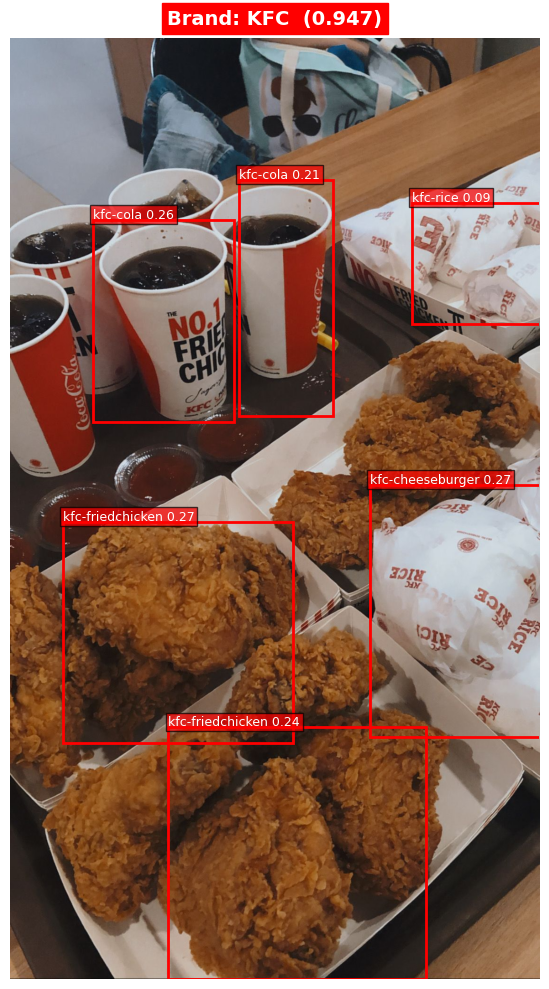


Brand  : kfc (0.947)
Items  : 6 terdeteksi
  kfc-friedchicken               score: 0.269
  kfc-cheeseburger               score: 0.267
  kfc-cola                       score: 0.259
  kfc-friedchicken               score: 0.236
  kfc-cola                       score: 0.209
  kfc-rice                       score: 0.092


{'brand': 'kfc',
 'brand_score': 0.947,
 'items': [{'label': 'kfc-friedchicken',
   'score': 0.2693,
   'box': {'y1': 0.5139, 'x1': 0.099, 'y2': 0.7491, 'x2': 0.5344}},
  {'label': 'kfc-cheeseburger',
   'score': 0.2673,
   'box': {'y1': 0.4746, 'x1': 0.6799, 'y2': 0.7431, 'x2': 1.0}},
  {'label': 'kfc-cola',
   'score': 0.2589,
   'box': {'y1': 0.1929, 'x1': 0.1562, 'y2': 0.4076, 'x2': 0.4231}},
  {'label': 'kfc-friedchicken',
   'score': 0.236,
   'box': {'y1': 0.7322, 'x1': 0.2988, 'y2': 1.0, 'x2': 0.785}},
  {'label': 'kfc-cola',
   'score': 0.2094,
   'box': {'y1': 0.1506, 'x1': 0.4326, 'y2': 0.4012, 'x2': 0.6105}},
  {'label': 'kfc-rice',
   'score': 0.0919,
   'box': {'y1': 0.1753, 'x1': 0.7592, 'y2': 0.3035, 'x2': 1.0}}]}

In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

def predict(img_path):
    raw = tf.io.read_file(img_path)
    img = tf.image.decode_image(raw, channels=3, expand_animations=False)

    # Model 1 — Brand
    img_brand = tf.image.resize(img, [224, 224])
    img_brand = tf.cast(img_brand, tf.float32) / 255.0
    img_brand = tf.expand_dims(img_brand, 0)
    brand_out   = brand_infer(img_brand)
    brand_pred  = list(brand_out.values())[0]
    brand_idx   = int(tf.argmax(brand_pred[0]))
    brand       = BRAND_NAMES[brand_idx]
    brand_score = float(brand_pred[0][brand_idx])

    # Model 2 — Menu
    img_menu = tf.image.resize(img, [512, 512])
    img_menu = tf.cast(img_menu, tf.float32) / 255.0
    img_menu = (img_menu - EFN_MEAN) / EFN_STD
    img_menu = tf.expand_dims(img_menu, 0)
    menu_out = menu_infer(img_menu)

    cls_pred = menu_out["cls"]
    reg_pred = menu_out["reg"]
    ctr_pred = menu_out["ctr"]

    boxes, scores, labels = postprocess_fcos(cls_pred, reg_pred, ctr_pred)

    results = []
    for box, score, label in zip(boxes, scores, labels):
        results.append({
            "label": f"{brand}-{ITEM_NAMES[label]}",
            "score": round(float(score), 4),
            "box"  : {
                "y1": round(float(box[0]), 4),
                "x1": round(float(box[1]), 4),
                "y2": round(float(box[2]), 4),
                "x2": round(float(box[3]), 4),
            }
        })

    return {
        "brand"      : brand,
        "brand_score": round(brand_score, 4),
        "items"      : results
    }


def predict_and_visualize(img_path):
    result = predict(img_path)

    img = mpimg.imread(img_path)
    h, w, _ = img.shape

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img)
    ax.set_title(
        f"Brand: {result['brand'].upper()}  ({result['brand_score']:.3f})",
        fontsize=14, fontweight="bold",
        color="white", backgroundcolor="red", pad=10
    )

    for item in result["items"]:
        y1 = item["box"]["y1"]
        x1 = item["box"]["x1"]
        y2 = item["box"]["y2"]
        x2 = item["box"]["x2"]

        rect = patches.Rectangle(
            (x1*w, y1*h), (x2-x1)*w, (y2-y1)*h,
            linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(x1*w, y1*h - 4,
                f"{item['label']} {item['score']:.2f}",
                color="white", fontsize=9,
                bbox=dict(facecolor="red", alpha=0.7, pad=2))

    ax.axis("off")
    plt.tight_layout()
    plt.show()

    print(f"\nBrand  : {result['brand']} ({result['brand_score']:.3f})")
    print(f"Items  : {len(result['items'])} terdeteksi")
    for item in result["items"]:
        print(f"  {item['label']:<30} score: {item['score']:.3f}")

    return result


predict_and_visualize("/content/2_jpg.rf.rmydmyKibYsI5xGxM0W5.jpg")